## Dataset : Ablated : 'JR_22-11-17'

In [1]:
from lineagetree import read_from_mastodon
import numpy as np
import matplotlib.pyplot as plt
import h5py
from skimage.segmentation import watershed

# CUSTOM FUNCTIONS
import watermasks.utils as utils
import watermasks.main as main

# TO RELOAD THEM FOR TESTING
import importlib

# --- IMPORT DATA AND FILES ---
path_h5, path_xml, path_mast, dir_input_images, dir_output_masks = utils.paths('JR_22-11-17_deconvolved')

In [2]:
TP = 400
VIEW='0'

In [20]:
# with h5py.File(path_h5, "r") as fin, h5py.File("new.h5", "w") as fout:
#     fin.copy(
#         fin[f't{TP:05}'][f's0{VIEW}']['2']['cells'],   # source dataset
#         fout,                  # destination file or group
#         name="cells"           # name in destination
#     )

In [5]:
path_h5 = 'D:\\users\\dhmhtrhs_tracking\\JR_22-10-17\\DUMMY - 400_MultiFused.Corrected.h5'

In [3]:
import h5py
import hdf5plugin 

with h5py.File(path_h5, "r") as f5:
    dset = f5[f't00{TP}'][f's0{VIEW}']['2']['cells']
    print(dset.compression)
    print(dset.compression_opts)
    print(dset._filters)

None
None
{'scaleoffset': (2, 0, 4096, 0, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1818321779, 1717989221, 7628147, 0)}


In [7]:
# import h5py
print("h5py version:", h5py.__version__)
print("HDF5 version:", h5py.version.hdf5_version)

h5py version: 3.15.1
HDF5 version: 1.14.6


## Working with pratially corrupted h5 files

In [8]:
# Check if gzip is available
print("gzip available:", h5py.h5z.filter_avail(h5py.h5z.FILTER_DEFLATE))

# List all available filters
import h5py.h5z as h5z
print("Available filters:")
for filter_id in [h5z.FILTER_DEFLATE, h5z.FILTER_SHUFFLE, h5z.FILTER_FLETCHER32, 
                   h5z.FILTER_SZIP, h5z.FILTER_NBIT, h5z.FILTER_SCALEOFFSET]:
    try:
        print(f"  Filter {filter_id}: {h5z.filter_avail(filter_id)}")
    except:
        pass

gzip available: True
Available filters:
  Filter 1: True
  Filter 2: True
  Filter 3: True
  Filter 4: False
  Filter 5: True
  Filter 6: True


In [4]:
with h5py.File(path_h5, "r") as f5:
    dataset = f5[f't00{TP}'][f's0{VIEW}']['2']['cells']
    
    # Get the dataset creation property list
    dcpl = dataset.id.get_create_plist()
    
    # Check number of filters
    n_filters = dcpl.get_nfilters()
    print(f"Number of filters: {n_filters}")
    
    # Get info for each filter
    for i in range(n_filters):
        filter_info = dcpl.get_filter(i)
        print(f"Filter {i}:")
        print(f"  ID: {filter_info[0]}")
        print(f"  Flags: {filter_info[1]}")
        print(f"  Name: {filter_info[3]}")
        print(f"  Config: {filter_info[2]}")

Number of filters: 1
Filter 0:
  ID: 6
  Flags: 1
  Name: b'scaleoffset'
  Config: (2, 0, 4096, 0, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1818321779, 1717989221, 7628147, 0)


In [10]:
import h5py.h5z as h5z

print("scaleoffset available:", h5z.filter_avail(h5z.FILTER_SCALEOFFSET))

scaleoffset available: True


In [ ]:
# # COPY THE CORRUPTED DATASET TO A SEPERATE FILE

# with h5py.File(path_h5, "r") as f_src, h5py.File("corrupt.h5", "w") as f_dst:
#     src_dset = f_src['t00402']['s02']['2']['cells']

#     # Create dataset in new file (NO compression = safest)
#     dst_dset = f_dst.create_dataset(
#         "cells",
#         data=src_dset[:],          # deep copy into RAM, then write
#         dtype=src_dset.dtype,
#         chunks=src_dset.chunks
#     )

#     # Copy attributes (metadata)
#     for k, v in src_dset.attrs.items():
#         print(v)
#         dst_dset.attrs[k] = v

OSError: Can't synchronously read data (filter returned failure during read)

## Count the number of corrupted chunks in the dataseet by timepoint

In [6]:
timepoints = []
num_corrupted_chunks = []

for tmp in [400]:
    with h5py.File(path_h5, "r") as f5:
        test_image_decon = f5[f't{tmp:05}'][f's0{VIEW}']['2']['cells'] # this is the group

        bad_chunks = []

        im_shape = test_image_decon.shape
        cz, cy, cx = test_image_decon.chunks
        datatype = test_image_decon.dtype
        # print(test_image_decon.chunks)
        # print(test_image_decon.compression)
        # print(test_image_decon.compression)
        # print(test_image_decon.compression_opts)

    for z in range(0, im_shape[0], cz):
        for y in range(0, im_shape[1], cy):
            for x in range(0, im_shape[2], cx):
                try:
                    _ = test_image_decon[z:z+cz, y:y+cy, x:x+cx]
                except Exception:
                    bad_chunks.append((z, y, x))

    timepoints.append(tmp)
    num_corrupted_chunks.append(len(bad_chunks))

In [7]:
print(bad_chunks)

[(0, 0, 0), (0, 0, 16), (0, 0, 32), (0, 0, 48), (0, 0, 64), (0, 0, 80), (0, 0, 96), (0, 0, 112), (0, 0, 128), (0, 0, 144), (0, 0, 160), (0, 0, 176), (0, 0, 192), (0, 0, 208), (0, 0, 224), (0, 0, 240), (0, 0, 256), (0, 0, 272), (0, 16, 0), (0, 16, 16), (0, 16, 32), (0, 16, 48), (0, 16, 64), (0, 16, 80), (0, 16, 96), (0, 16, 112), (0, 16, 128), (0, 16, 144), (0, 16, 160), (0, 16, 176), (0, 16, 192), (0, 16, 208), (0, 16, 224), (0, 16, 240), (0, 16, 256), (0, 16, 272), (0, 32, 0), (0, 32, 16), (0, 32, 32), (0, 32, 48), (0, 32, 64), (0, 32, 80), (0, 32, 96), (0, 32, 112), (0, 32, 128), (0, 32, 144), (0, 32, 160), (0, 32, 176), (0, 32, 192), (0, 32, 208), (0, 32, 224), (0, 32, 240), (0, 32, 256), (0, 32, 272), (0, 48, 0), (0, 48, 16), (0, 48, 32), (0, 48, 48), (0, 48, 64), (0, 48, 80), (0, 48, 96), (0, 48, 112), (0, 48, 128), (0, 48, 144), (0, 48, 160), (0, 48, 176), (0, 48, 192), (0, 48, 208), (0, 48, 224), (0, 48, 240), (0, 48, 256), (0, 48, 272), (0, 64, 0), (0, 64, 16), (0, 64, 32), (0,

In [9]:
num_corrupted_chunks

[5508]

In [10]:
258/16

16.125

In [8]:
im_shape

(265, 286, 285)

In [10]:
from matplotlib import pyplot as plt

In [12]:
bad_chunks

[(0, 0, 0),
 (0, 0, 16),
 (0, 0, 32),
 (0, 0, 48),
 (0, 0, 64),
 (0, 0, 80),
 (0, 0, 96),
 (0, 0, 112),
 (0, 0, 128),
 (0, 0, 144),
 (0, 0, 160),
 (0, 0, 176),
 (0, 0, 192),
 (0, 0, 208),
 (0, 0, 224),
 (0, 0, 240),
 (0, 0, 256),
 (0, 0, 272),
 (0, 16, 0),
 (0, 16, 16),
 (0, 16, 32),
 (0, 16, 48),
 (0, 16, 64),
 (0, 16, 80),
 (0, 16, 96),
 (0, 16, 112),
 (0, 16, 128),
 (0, 16, 144),
 (0, 16, 160),
 (0, 16, 176),
 (0, 16, 192),
 (0, 16, 208),
 (0, 16, 224),
 (0, 16, 240),
 (0, 16, 256),
 (0, 16, 272),
 (0, 32, 0),
 (0, 32, 16),
 (0, 32, 32),
 (0, 32, 48),
 (0, 32, 64),
 (0, 32, 80),
 (0, 32, 96),
 (0, 32, 112),
 (0, 32, 128),
 (0, 32, 144),
 (0, 32, 160),
 (0, 32, 176),
 (0, 32, 192),
 (0, 32, 208),
 (0, 32, 224),
 (0, 32, 240),
 (0, 32, 256),
 (0, 32, 272),
 (0, 48, 0),
 (0, 48, 16),
 (0, 48, 32),
 (0, 48, 48),
 (0, 48, 64),
 (0, 48, 80),
 (0, 48, 96),
 (0, 48, 112),
 (0, 48, 128),
 (0, 48, 144),
 (0, 48, 160),
 (0, 48, 176),
 (0, 48, 192),
 (0, 48, 208),
 (0, 48, 224),
 (0, 48, 240),


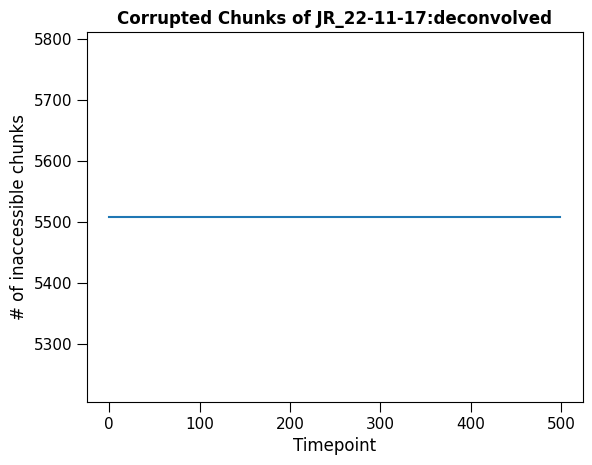

In [11]:
# --- PLOT ---
plt.plot(timepoints, num_corrupted_chunks)
plt.xlabel("Timepoint", size=12)
plt.ylabel("# of inaccessible chunks", size=12)
plt.title("Corrupted Chunks of JR_22-11-17:deconvolved", weight='bold', size=12)
plt.tick_params(size=7)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.show()

## Recreate the image, by replacing the corrupted chunks with black boxes

In [ ]:
import numpy as np
# --- RECREATE THE IMAGE BY REPLAING THE CORRUPTED CHUNKS WITH BLACK BOXES ---
out = np.zeros(im_shape, dtype=datatype)

for z in range(0, im_shape[0], cz):
    for y in range(0, im_shape[1], cy):
        for x in range(0, im_shape[2], cx): a 
            try:
                out[z:z+cz, y:y+cy, x:x+cx] = \
                    test_image_decon[z:z+cz, y:y+cy, x:x+cx]
            except Exception:
                # corrupted chunk → leave zeros
                pass

In [13]:
import napari

viewer = napari.Viewer()
# viewer.add_image(test_image_decon)
viewer.add_image(out)
napari.run()

## Continue with image proccessing and mask creation

In [ ]:
# LOAD REG. MATRICES AND LINEAGETREE
R_of_t = import_registration_mats_multiview(path_xml, TP-5,TP+5)
lT = read_from_mastodon(path_mast)

shape_test_image = np.array(np.shape(out))
# shape_full_h5 = np.asarray([304, 1602, 2140]) # This is the h5 with the original images : view 0 and view 1
shape_full_deconvolved = np.asarray([1063, 1145, 1142]) # This has been checked by loading the 0-th decomression h5 level of the deconvolved file

# scaling = scaling * np.shape(test_image)/shape_test_image # this had to be done because I couldn't open the first (and second) layer of the h5  for the devonvolved dataset
scaling = shape_test_image/shape_full_deconvolved # this had to be done because I couldn't open the first (and second) layer of the h5  for the devonvolved dataset
# print(f'full image shape = {shape_full_deconvolved}\n2nd h5 layer has shape = {shape_test_image} \n-scaling ratio is [z, y, x] = {scaling}')

# GET THE REGISTERED MASTODON POSITIONS
reg_pos_at_t = []
for mastodon_id_t in lT.time_nodes[TP]:
    x, y, z = registered_position_of_id_in_t(mastodon_id_t, lT, TP, R_of_t, VIEW, scaling, Transformations_In_Reverse=False)
    reg_pos_at_t.append([x, y, z])
reg_pos_at_t = np.asarray(reg_pos_at_t)

# --- VISUALIZE THE ANNOTATIONS ---
an_space = paint_annotations(TP, lT, np.array(shape_test_image), R_of_t, scaling, VIEW, 1, Transformations_In_Reverse=False)

transformations extracted for all views from xml
{137115: array([], dtype=int32), 137114: array([], dtype=int32), 137113: array([], dtype=int32), 137112: array([], dtype=int32), 137111: array([], dtype=int32), 137110: array([], dtype=int32), 137109: array([], dtype=int32), 137108: array([], dtype=int32), 137107: array([], dtype=int32), 137106: array([], dtype=int32), 137105: array([], dtype=int32), 137104: array([], dtype=int32), 137103: array([], dtype=int32), 137102: array([], dtype=int32), 137101: array([], dtype=int32), 137100: array([], dtype=int32), 137099: array([], dtype=int32), 137098: array([], dtype=int32), 137097: array([], dtype=int32), 137096: array([], dtype=int32), 137095: array([], dtype=int32), 137094: array([], dtype=int32), 137093: array([], dtype=int32), 137092: array([], dtype=int32), 137091: array([], dtype=int32), 137090: array([], dtype=int32), 137089: array([], dtype=int32), 137088: array([], dtype=int32), 137087: array([], dtype=int32), 137086: array([], dtyp

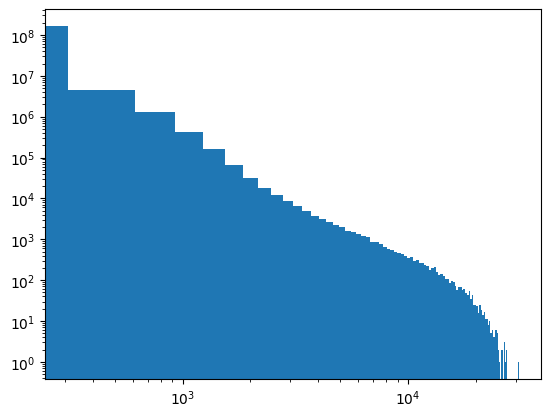

In [16]:
plt.hist(out.ravel(), bins=100)
plt.yscale('log')
plt.xscale('log')